<a href="https://colab.research.google.com/github/shree180103/C_GAN/blob/main/c_gan_mnist_exp_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import torch
from torch import nn
from torch.utils.data import DataLoader
import torchvision
from torchvision.transforms import ToTensor
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torch.utils.tensorboard import SummaryWriter

In [2]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [3]:
class Discriminator(nn.Module):
  def __init__(self,input_shape:int,num_classes:int,img_size:int):
    super().__init__()
    self.img_size=img_size
    self.conv_layer=nn.Sequential(
        nn.Conv2d(in_channels=input_shape+1,out_channels=64,kernel_size=4,stride=2,padding=1,bias=False),
        nn.LeakyReLU(0.2,inplace=True),
        nn.Conv2d(in_channels=64,out_channels=128,kernel_size=4,stride=2,padding=1,bias=False),
        nn.BatchNorm2d(128),
        nn.LeakyReLU(0.2,inplace=True),
        nn.Conv2d(in_channels=128,out_channels=256,kernel_size=4,stride=2,padding=1,bias=False),
        nn.BatchNorm2d(256),
        nn.LeakyReLU(0.2,inplace=True),
        nn.Conv2d(in_channels=256,out_channels=512,kernel_size=4,stride=2,padding=1,bias=False),
        nn.BatchNorm2d(512),
        nn.LeakyReLU(0.2,inplace=True),
        nn.Conv2d(in_channels=512,out_channels=1,kernel_size=4,stride=1,padding=0,bias=False),
        nn.Sigmoid()
    )

    self.embed=nn.Embedding(num_embeddings=num_classes,embedding_dim=img_size*img_size)

  def forward(self,x,labels):
    embedding=self.embed(labels).view(labels.shape[0],1,self.img_size,self.img_size)
    x=torch.cat([x,embedding],dim=1)
    return self.conv_layer(x)


In [4]:
class Generator(nn.Module):
  def __init__(self,z_dim:int,img_channels:int,num_classes:int,img_size:int,embed_size:int):
    super().__init__()
    self.img_size=img_size
    self.trans_conv_layer=nn.Sequential(
        nn.ConvTranspose2d(in_channels=z_dim+embed_size,out_channels=512,kernel_size=4,stride=1,padding=0,bias=False),
        nn.BatchNorm2d(512),
        nn.ReLU(True),
        nn.ConvTranspose2d(in_channels=512,out_channels=256,kernel_size=4,stride=2,padding=1,bias=False),
        nn.BatchNorm2d(256),
        nn.ReLU(True),
        nn.ConvTranspose2d(in_channels=256,out_channels=128,kernel_size=4,stride=2,padding=1,bias=False),
        nn.BatchNorm2d(128),
        nn.ReLU(True),
        nn.ConvTranspose2d(in_channels=128,out_channels=64,kernel_size=4,stride=2,padding=1,bias=False),
        nn.BatchNorm2d(64),
        nn.ReLU(True),
        nn.ConvTranspose2d(in_channels=64,out_channels=img_channels,kernel_size=4,stride=2,padding=1,bias=False),
        nn.Tanh()


    )
    self.embed=nn.Embedding(num_classes,embed_size)

  def forward(self,x,labels):
    embedding=self.embed(labels).unsqueeze(2).unsqueeze(3) # to get extra dim at position 2 and 3 so that z=[n,z_dim,1,1]
    x=torch.cat([x,embedding],dim=1)
    return self.trans_conv_layer(x)




In [5]:
# training params
batch_size=128
lr=0.0002
z_dim=100
img_size=64
n_c=1
embed_size=100
transform=transforms.Compose(transforms=[transforms.ToTensor(),
                                         transforms.Resize((64,64)),
                                         transforms.CenterCrop(img_size),
                                         transforms.Normalize([0.5 for _ in range(n_c)],[0.5 for _ in range(n_c)])])
dataset=datasets.MNIST(root="data",transform=transform,download=True)
data_loader=DataLoader(dataset=dataset,batch_size=batch_size,shuffle=True)

num_classes=len(dataset.classes)

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 9912422/9912422 [00:02<00:00, 4568582.76it/s]


Extracting data/MNIST/raw/train-images-idx3-ubyte.gz to data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 28881/28881 [00:00<00:00, 131870.62it/s]


Extracting data/MNIST/raw/train-labels-idx1-ubyte.gz to data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 1648877/1648877 [00:06<00:00, 252248.50it/s]


Extracting data/MNIST/raw/t10k-images-idx3-ubyte.gz to data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 4542/4542 [00:00<00:00, 3103197.39it/s]

Extracting data/MNIST/raw/t10k-labels-idx1-ubyte.gz to data/MNIST/raw



In [6]:
device="cuda" if torch.cuda.is_available() else "cpu"
n_c=1

gen=Generator(z_dim=100,img_channels=n_c,num_classes=num_classes,img_size=img_size,embed_size=embed_size).to(device)
gen.apply(weights_init)

disc=Discriminator(input_shape=n_c,num_classes=num_classes,img_size=img_size).to(device)
disc.apply(weights_init)


Discriminator(
  (conv_layer): Sequential(
    (0): Conv2d(2, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
  (embed): Embedding(10, 4

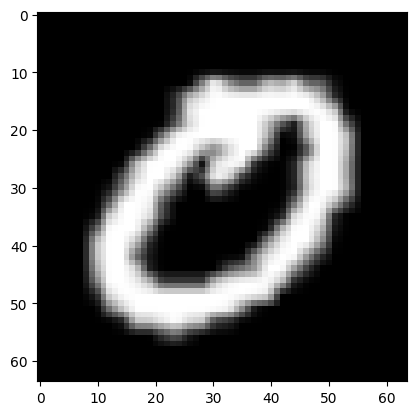

In [7]:
image,label=next(iter(data_loader))
import matplotlib.pyplot as plt
plt.imshow(image[0].reshape(64,64),cmap='gray')
plt.show()

In [8]:
# label

In [9]:
# embed=nn.Embedding(num_embeddings=num_classes,embedding_dim=img_size*img_size)

# embed(label)

In [10]:
# embed(label).shape

In [11]:
# embed(label).view(label.shape[0],1,img_size,img_size).shape

In [12]:
# z=torch.randn(128,100+100,1,1)


In [13]:
loss_fn=nn.BCELoss()
optimizer_disc=torch.optim.Adam(params=disc.parameters(),lr=lr,betas=(0.5,0.999))
optimizer_gen=torch.optim.Adam(params=gen.parameters(),lr=lr,betas=(0.5,0.999))

In [26]:
writer_fake=SummaryWriter(f"runs/GAN_MNIST/fake")

writer_real=SummaryWriter(f"runs/GAN_MNIST/real")

step = 0

fixed_noise = torch.randn(size=(128,z_dim,1,1))

In [15]:
# z=torch.rand(size=(1,100,1,1))
# z.shape

In [16]:
# img,label=next(iter(data_loader))
# img.shape

In [17]:
!pip install torchinfo

In [18]:
from torchinfo import summary
labels = torch.randint(0, 10, (1,))
summary(disc,input_size=[1,1,64,64],labels=labels.to(device))

Layer (type:depth-idx)                   Output Shape              Param #
Discriminator                            [1, 1, 1, 1]              --
├─Embedding: 1-1                         [1, 4096]                 40,960
├─Sequential: 1-2                        [1, 1, 1, 1]              --
│    └─Conv2d: 2-1                       [1, 64, 32, 32]           2,048
│    └─LeakyReLU: 2-2                    [1, 64, 32, 32]           --
│    └─Conv2d: 2-3                       [1, 128, 16, 16]          131,072
│    └─BatchNorm2d: 2-4                  [1, 128, 16, 16]          256
│    └─LeakyReLU: 2-5                    [1, 128, 16, 16]          --
│    └─Conv2d: 2-6                       [1, 256, 8, 8]            524,288
│    └─BatchNorm2d: 2-7                  [1, 256, 8, 8]            512
│    └─LeakyReLU: 2-8                    [1, 256, 8, 8]            --
│    └─Conv2d: 2-9                       [1, 512, 4, 4]            2,097,152
│    └─BatchNorm2d: 2-10                 [1, 512, 4, 4]    

In [19]:
# disc.eval()
# with torch.inference_mode():
#   print(disc(torch.rand(size=(1,1,64,64)).to('cuda')).shape)


In [20]:
# disc.eval()
# with torch.inference_mode():
#   print(disc(torch.rand(size=(1,1,64,64)).to('cuda')).shape)

In [21]:
labels = torch.randint(0, 10, (1,))

summary(gen,input_size=[1,100,1,1],labels=labels.to(device))

Layer (type:depth-idx)                   Output Shape              Param #
Generator                                [1, 1, 64, 64]            --
├─Embedding: 1-1                         [1, 100]                  1,000
├─Sequential: 1-2                        [1, 1, 64, 64]            --
│    └─ConvTranspose2d: 2-1              [1, 512, 4, 4]            1,638,400
│    └─BatchNorm2d: 2-2                  [1, 512, 4, 4]            1,024
│    └─ReLU: 2-3                         [1, 512, 4, 4]            --
│    └─ConvTranspose2d: 2-4              [1, 256, 8, 8]            2,097,152
│    └─BatchNorm2d: 2-5                  [1, 256, 8, 8]            512
│    └─ReLU: 2-6                         [1, 256, 8, 8]            --
│    └─ConvTranspose2d: 2-7              [1, 128, 16, 16]          524,288
│    └─BatchNorm2d: 2-8                  [1, 128, 16, 16]          256
│    └─ReLU: 2-9                         [1, 128, 16, 16]          --
│    └─ConvTranspose2d: 2-10             [1, 64, 32, 32]  

In [ ]:
# gen.eval()
# with torch.inference_mode():
#   print(gen(z.to('cuda')).shape)

In [28]:
from tqdm.auto import tqdm

epochs=5


for epoch in tqdm(range(epochs)):
  for batch_idx,(x,labels) in enumerate(data_loader):
    x=x.to(device)
    labels=labels.to(device)
    cur_batch_size=x.shape[0]
    z=torch.randn(size=(cur_batch_size,100,1,1),device=device)

    ## traing the discriminator

    disc.zero_grad()
    disc_real=disc(x.to('cuda'),labels.to('cuda')).reshape(-1)
    loss_disc_real=loss_fn(disc_real,torch.ones_like(disc_real))
    loss_disc_real.backward()


    fake=gen(z.to('cuda'),labels.to('cuda'))
    disc_fake=disc(fake.detach().to('cuda'),labels.to('cuda')).reshape(-1)
    loss_disc_fake=loss_fn(disc_fake,torch.zeros_like(disc_fake))
    loss_disc_fake.backward()

    loss_disc=loss_disc_fake+loss_disc_real

    optimizer_disc.step()

    #training generator
    gen.zero_grad()

    fool_logits=disc(fake.to('cuda'),labels.to('cuda')).reshape(-1)
    loss_gen=loss_fn(fool_logits,torch.ones_like(fool_logits))

    loss_gen.backward()

    optimizer_gen.step()

    if batch_idx % 50== 0:
            print(
                f"Epoch [{epoch}/{epochs}] Batch {batch_idx}/{len(data_loader)} \
                  Loss D: {loss_disc:.4f}, loss G: {loss_gen:.4f}"
            )

            with torch.no_grad():
                fake = gen(z.to('cuda'),labels.to('cuda')).detach()
                # take out (up to) 32 examples
                img_grid_real = torchvision.utils.make_grid(x[:32], normalize=True)
                img_grid_fake = torchvision.utils.make_grid(fake[:32], normalize=True)

                writer_real.add_image("Real", img_grid_real, global_step=step)
                writer_fake.add_image("Fake", img_grid_fake, global_step=step)

            step += 1











  0%|          | 0/5 [00:00<?, ?it/s]

Epoch [0/5] Batch 0/469                   Loss D: 0.8456, loss G: 3.5305
Epoch [0/5] Batch 50/469                   Loss D: 0.9860, loss G: 3.6325
Epoch [0/5] Batch 100/469                   Loss D: 0.4892, loss G: 2.9922
Epoch [0/5] Batch 150/469                   Loss D: 0.7761, loss G: 1.9154
Epoch [0/5] Batch 200/469                   Loss D: 1.2789, loss G: 2.0281
Epoch [0/5] Batch 250/469                   Loss D: 0.9553, loss G: 1.7562
Epoch [0/5] Batch 300/469                   Loss D: 1.1615, loss G: 4.7952
Epoch [0/5] Batch 350/469                   Loss D: 0.5433, loss G: 2.9344
Epoch [0/5] Batch 400/469                   Loss D: 0.9507, loss G: 1.9861
Epoch [0/5] Batch 450/469                   Loss D: 0.8812, loss G: 2.1059
Epoch [1/5] Batch 0/469                   Loss D: 0.8827, loss G: 1.6786
Epoch [1/5] Batch 50/469                   Loss D: 0.4920, loss G: 3.8504
Epoch [1/5] Batch 100/469                   Loss D: 0.7750, loss G: 4.2689
Epoch [1/5] Batch 150/469      

In [29]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [32]:
noise=torch.rand(size=(batch_size,z_dim,1,1)).to(device)
labels=torch.randint(0,10,(batch_size,)).to(device)
gen_img=gen(noise,labels)

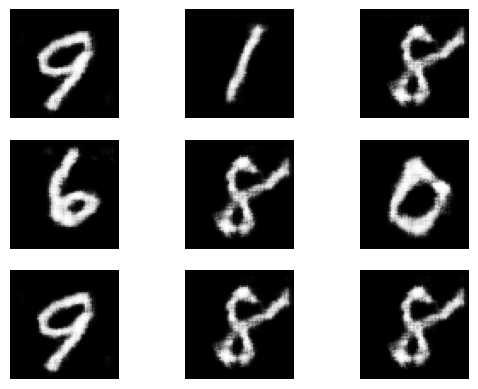

In [33]:
with torch.inference_mode():
  for i in range(9):
    plt.subplot(3,3,i+1)
    plt.imshow(gen_img[i].cpu().squeeze(),cmap="gray")
    plt.axis(False)

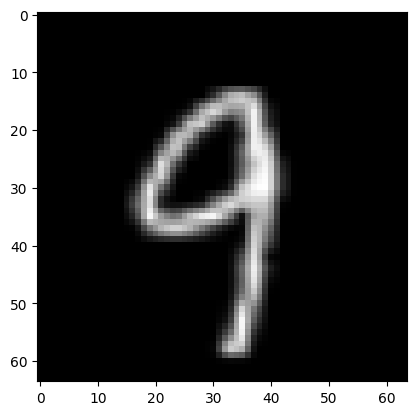

In [62]:
image,labels=next(iter(data_loader))
plt.imshow(image[0].reshape(64,64),cmap="gray")


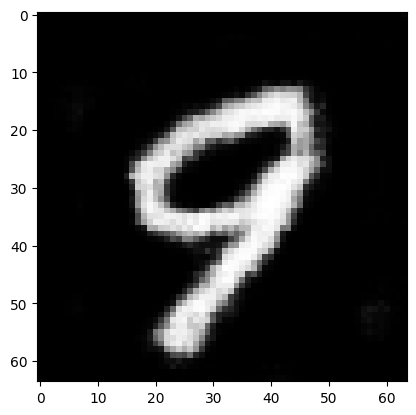

In [63]:
noise=torch.rand(size=(128,z_dim,1,1)).to(device)
gen_img=gen(noise,labels.to(device))
plt.imshow(gen_img[0].cpu().detach().squeeze(),cmap="gray")
